# Credit Card Fraud detection using Logistic Regression

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
dataset = pd.read_csv("creditcard.csv")

In [3]:
dataset.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0.0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0.0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0.0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0.0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0.0


In [4]:
dataset.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,206058.000000,206058.000000,206058.000000,206058.000000,206058.000000,206058.000000,206058.000000,206058.000000,206058.000000,206058.000000,...,206057.000000,206057.000000,206057.000000,206057.000000,206057.000000,206057.000000,206057.000000,206057.000000,206057.000000,206057.000000
mean,72524.529851,-0.091921,0.000151,0.285304,0.067336,-0.097879,0.042313,-0.043699,0.013112,0.008268,...,-0.012778,-0.041143,-0.014040,0.003672,0.055391,0.005320,0.001205,0.001680,89.811415,0.001907
std,35786.514478,1.899216,1.624939,1.458224,1.400875,1.362827,1.313881,1.217289,1.207034,1.132677,...,0.736538,0.695352,0.614242,0.604046,0.495831,0.487992,0.395275,0.318113,248.233648,0.043630
min,0.000000,-56.407510,-72.715728,-33.680984,-5.683171,-42.147898,-26.160506,-43.557242,-73.216718,-13.434066,...,-34.830382,-10.933144,-44.807735,-2.836627,-10.295397,-2.604551,-22.565679,-11.710896,0.000000,0.000000
25%,44991.250000,-0.958181,-0.584765,-0.393195,-0.800252,-0.774148,-0.715727,-0.573587,-0.185064,-0.662093,...,-0.226643,-0.536277,-0.168323,-0.343759,-0.248673,-0.331301,-0.067888,-0.043589,5.990000,0.000000
50%,68467.500000,-0.071935,0.078156,0.464198,0.068243,-0.156666,-0.223056,-0.004758,0.040356,-0.072020,...,-0.040768,-0.028916,-0.027552,0.051474,0.096843,-0.061047,0.005259,0.017847,23.000000,0.000000
75%,101919.000000,1.220537,0.782262,1.204658,0.873100,0.483409,0.441361,0.510280,0.336333,0.623395,...,0.155270,0.436721,0.117710,0.423457,0.382252,0.259817,0.088998,0.077944,79.500000,0.000000
max,136047.000000,2.454930,22.057729,9.382558,16.875344,34.801666,22.529298,36.677268,20.007208,15.594995,...,27.202839,10.503090,19.002942,4.022866,7.519589,3.517346,12.152401,33.847808,19656.530000,1.000000


In [5]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206058 entries, 0 to 206057
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    206058 non-null  float64
 1   V1      206058 non-null  float64
 2   V2      206058 non-null  float64
 3   V3      206058 non-null  float64
 4   V4      206058 non-null  float64
 5   V5      206058 non-null  float64
 6   V6      206058 non-null  float64
 7   V7      206058 non-null  float64
 8   V8      206058 non-null  float64
 9   V9      206058 non-null  float64
 10  V10     206058 non-null  float64
 11  V11     206058 non-null  float64
 12  V12     206058 non-null  float64
 13  V13     206058 non-null  float64
 14  V14     206058 non-null  float64
 15  V15     206058 non-null  float64
 16  V16     206058 non-null  float64
 17  V17     206058 non-null  float64
 18  V18     206058 non-null  float64
 19  V19     206058 non-null  float64
 20  V20     206058 non-null  float64
 21  V21     20

In [6]:
dataset.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

# check null values

In [7]:
dataset.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       1
V22       1
V23       1
V24       1
V25       1
V26       1
V27       1
V28       1
Amount    1
Class     1
dtype: int64

# drop null values

In [11]:
dataset=dataset.dropna(axis=0)

In [12]:
dataset.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

# check duplicates

In [15]:
dataset.duplicated().sum()

734

In [16]:
dataset.shape

(206057, 31)

# drop the duplicates

In [17]:
dataset=dataset.drop_duplicates()

In [18]:
dataset.shape

(205323, 31)

In [19]:
dataset.duplicated().sum()

0

# find correlation

<AxesSubplot:>

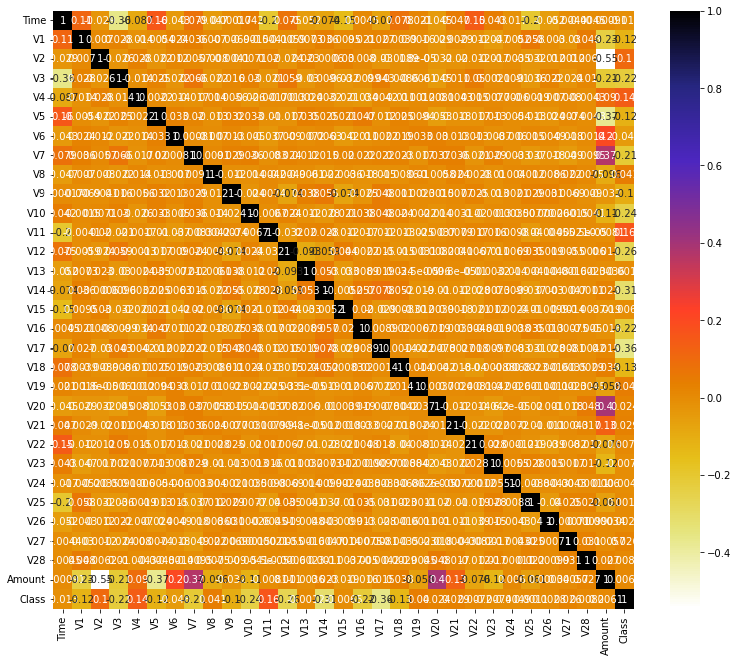

In [45]:
plt.figure(figsize=(13,11))
cor=dataset.corr()
sns.heatmap(cor,annot=True, cmap=plt.cm.CMRmap_r)

In [46]:
dataset.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In  class column :  0 shows No fraud  and 1 shows  fraud

In [47]:
dataset['Class'].value_counts()

0.0    204948
1.0       375
Name: Class, dtype: int64

# Divide features into dependent and independent column

In [23]:
y= dataset['Class'] #dependent variable is Decision
x= dataset.drop(['Class'], axis=1)

# split the data into train and test

In [24]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.25, random_state = 0)

# split the data into train and test

In [25]:
from sklearn.preprocessing import StandardScaler
sc_x = StandardScaler()
xtrain = sc_x.fit_transform(X_train) 
xtest = sc_x.transform(X_test)

print (xtrain[0:10, :])

[[-7.72702526e-01  6.26210736e-01  9.00084448e-02  1.49458991e-01
   9.04715244e-01 -6.98223275e-02 -1.11261637e-02  2.90617097e-02
   8.04190022e-02 -8.99551355e-03  4.27011021e-02  1.21000530e+00
   1.31885310e+00 -1.39380186e-01  2.11682042e-01 -9.57591688e-01
  -6.65076447e-01  6.40927997e-02 -6.37704399e-01 -1.79793407e-01
  -2.38665014e-01 -2.07337937e-02  2.04181688e-01 -7.71936741e-02
   3.84706286e-01  1.11601537e+00 -7.15858229e-01  8.52004242e-02
   2.57621731e-02 -2.97090957e-01]
 [ 1.61341136e+00  5.34450018e-01 -1.68646661e+00 -2.45664234e+00
  -5.30083099e-02 -3.01489042e-01 -8.98473315e-01  1.08131563e+00
  -5.18393869e-01 -1.05150206e+00  8.90150284e-01 -3.06355241e-02
  -5.30753593e-01 -1.82022983e+00  1.41688933e+00 -8.97669412e-01
  -2.05915435e+00 -7.31195079e-02  1.90697921e+00 -5.50307623e-01
   8.45459639e-01  4.54507642e-01 -1.06763375e-01 -1.16723243e+00
  -4.70458924e-01  2.93641061e-01  1.94457169e+00 -6.93649038e-01
   2.38915640e-02  2.48891920e+00]
 [-1.8

# apply logistic regression

In [26]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(xtrain, y_train)

LogisticRegression(random_state=0)

In [27]:
y_pred = classifier.predict(xtest)

# check confusion matrix

In [28]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
  
print ("Confusion Matrix : \n", cm)

Confusion Matrix : 
 [[51226     9]
 [   48    48]]


# check model accuracy

In [29]:
from sklearn.metrics import accuracy_score
print ("Accuracy : ", accuracy_score(y_test, y_pred))

Accuracy :  0.9988895599150611


In [33]:
dataset.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

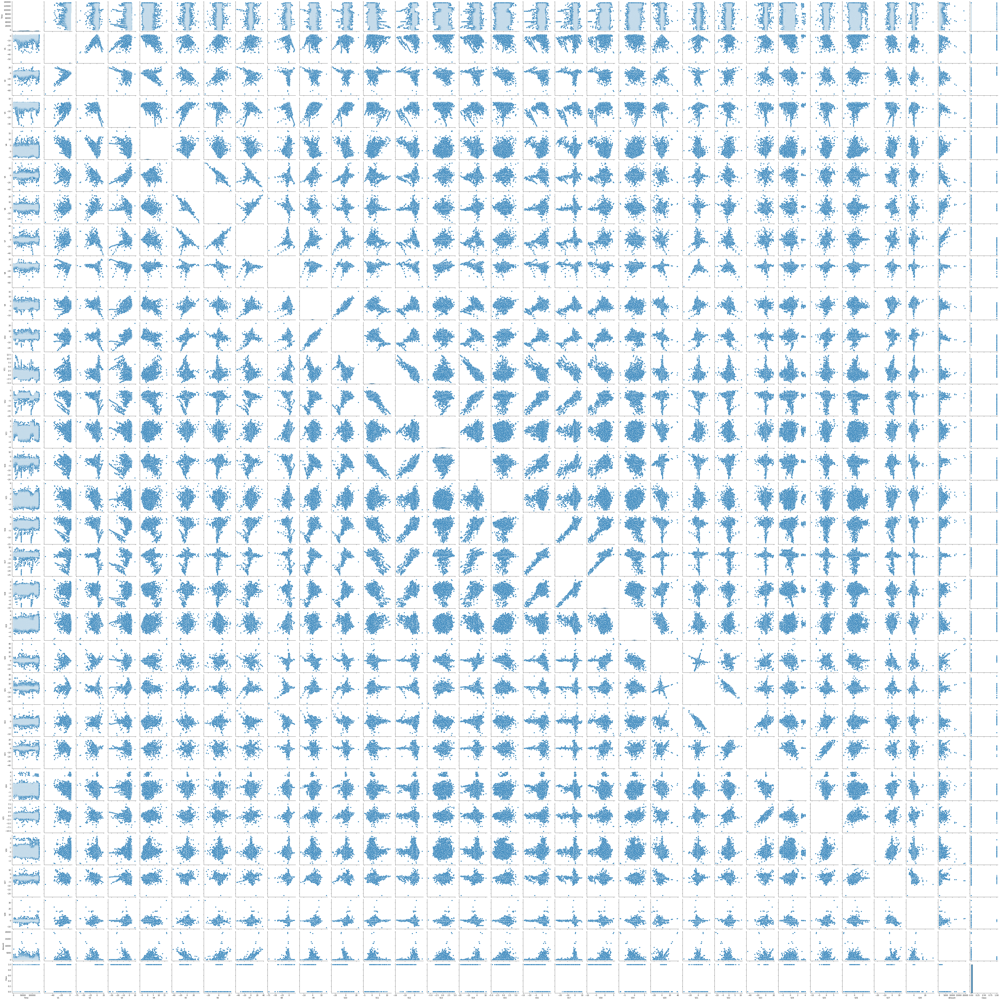

In [34]:
sns.pairplot(dataset)

In [35]:
dataset['Class'].value_counts()

0.0    204948
1.0       375
Name: Class, dtype: int64

# predict values and compare with actual data

In [36]:
predictions = classifier.predict(X_test)
comparison = pd.DataFrame({'Predicted Values':predictions,'Actual Values':y_test})

In [39]:
comparison.head(15)

,Predicted Values,Actual Values
85886,0.0,0.0
68181,0.0,0.0
23466,0.0,0.0
121510,0.0,0.0
143004,0.0,0.0
176863,0.0,0.0
67776,0.0,0.0
68444,0.0,0.0
157431,0.0,0.0
92948,0.0,0.0


# check fraud and not fraud percentage

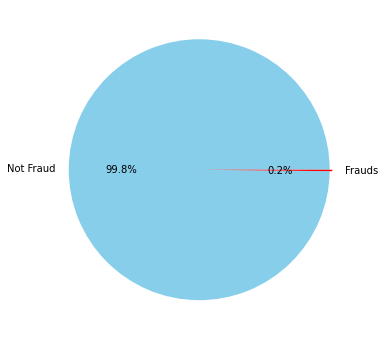

In [41]:
plt.figure(figsize=(10,6))
labels=['Not Fraud' , 'Frauds']
explode = [.01,.01]
color=['skyblue' , 'Red']
sizes=dataset.Class.value_counts().values

plt.pie(sizes,explode,labels,autopct="%1.1f%%", colors = color)
plt.show()

# plot fraud and not fraud separately

(375, 31) (204948, 31)


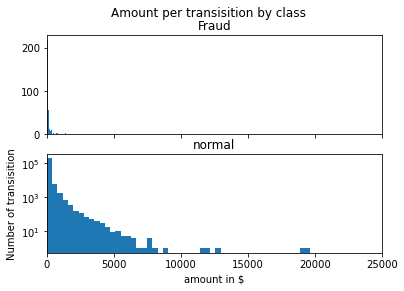

In [44]:
fraud=dataset[dataset['Class']==1]
normal=dataset[dataset['Class']==0]
print(fraud.shape , normal.shape)

f,(ax1,ax2)=plt.subplots(2,1,sharex=True)
f.suptitle('Amount per transisition by class')
bins =50
ax1.hist(fraud.Amount , bins=bins)
ax1.set_title('Fraud')

ax2.hist(normal.Amount,bins=bins)
ax2.set_title('normal')

plt.xlabel('amount in $')
plt.ylabel('Number of transisition')

plt.xlim(0,25000)
plt.yscale('log')
plt.show()